C:\Users\loneo\AppData\Local\Temp\ipykernel_27352\2861382384.py:45: UserWarning: Glyph 8451 (\N{DEGREE CELSIUS}) missing from current font.
  plt.tight_layout()
C:\Users\loneo\AppData\Local\Temp\ipykernel_27352\2861382384.py:48: UserWarning: Glyph 8451 (\N{DEGREE CELSIUS}) missing from current font.
  plt.savefig(r"C:\Users\loneo\OneDrive\Documents\mini project\fabrication_scatter_plots.png", dpi=300)
C:\Users\loneo\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8451 (\N{DEGREE CELSIUS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


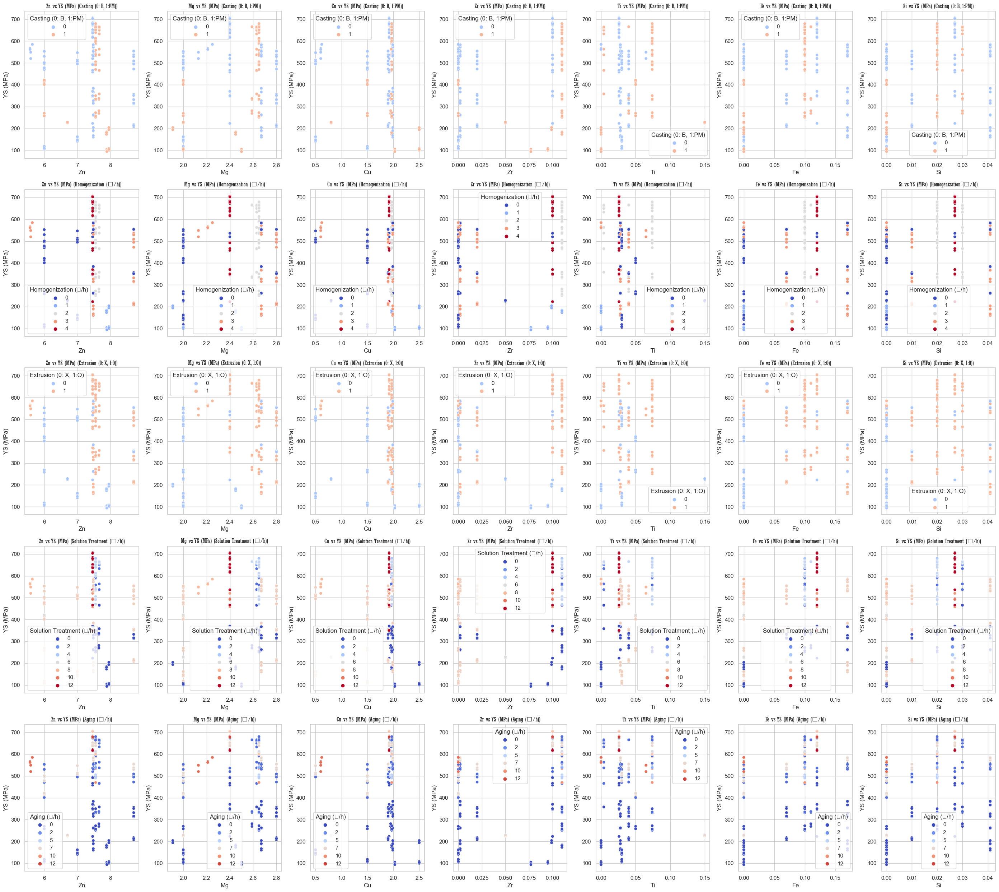

In [7]:
#old degree c

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# Ensure you use a font that supports the degree Celsius symbol, e.g., 'Arial' or 'Noto Sans'
prop = fm.FontProperties(fname=fm.findSystemFonts(fontpaths=None, fontext='ttf')[0])  # Load a system font

# Alternatively, specify a known path to a font like Arial Unicode MS or Noto Sans
# prop = fm.FontProperties(fname=r"C:\Windows\Fonts\arial.ttf")

# Load the Excel file using the given path
file_path = r"C:\Users\loneo\OneDrive\Documents\mini project\al data.xlsx"
data_cleaned = pd.read_excel(file_path, header=1)

# Rename columns for better readability
data_cleaned.columns = ['Index', 'Zn', 'Mg', 'Cu', 'Zr', 'Ti', 'Fe', 'Si', 'Casting (0: B, 1:PM)', 
                        'Homogenization (℃/h)', 'Extrusion (0: X, 1:O)', 'Solution Treatment (℃/h)', 
                        'Aging (℃/h)', 'YS (MPa)', 'TS (MPa)', 'EL (%)']

# Drop rows with missing or invalid data
data_cleaned.dropna(subset=['Zn', 'Mg', 'Cu', 'Zr', 'Ti', 'Fe', 'Si', 'YS (MPa)', 'TS (MPa)', 'EL (%)'], inplace=True)

# Set up the plotting environment
sns.set(style="whitegrid")
fig, axes = plt.subplots(5, 7, figsize=(28, 25))

# List of elements and their corresponding tensile properties
elements = ['Zn', 'Mg', 'Cu', 'Zr', 'Ti', 'Fe', 'Si']
properties = ['YS (MPa)', 'TS (MPa)', 'EL (%)']

# List of fabrication processes for color encoding
fabrication_processes = ['Casting (0: B, 1:PM)', 'Homogenization (℃/h)', 'Extrusion (0: X, 1:O)', 
                         'Solution Treatment (℃/h)', 'Aging (℃/h)']

# Create scatter plots for each element vs tensile properties, color encoded by different fabrication processes
for i, element in enumerate(elements):
    for j, process in enumerate(fabrication_processes):
        # Scatter plot: YS (MPa) vs Element, colored by the fabrication process
        sns.scatterplot(ax=axes[j, i], x=data_cleaned[element], y=data_cleaned['YS (MPa)'], 
                        hue=data_cleaned[process], palette='coolwarm')
        axes[j, i].set_title(f'{element} vs YS (MPa) ({process})', fontproperties=prop)

# Adjust layout to prevent overlapping
plt.tight_layout()

# Save the figure as a PNG image
plt.savefig(r"C:\Users\loneo\OneDrive\Documents\mini project\fabrication_scatter_plots.png", dpi=300)

# Show the plot
plt.show()


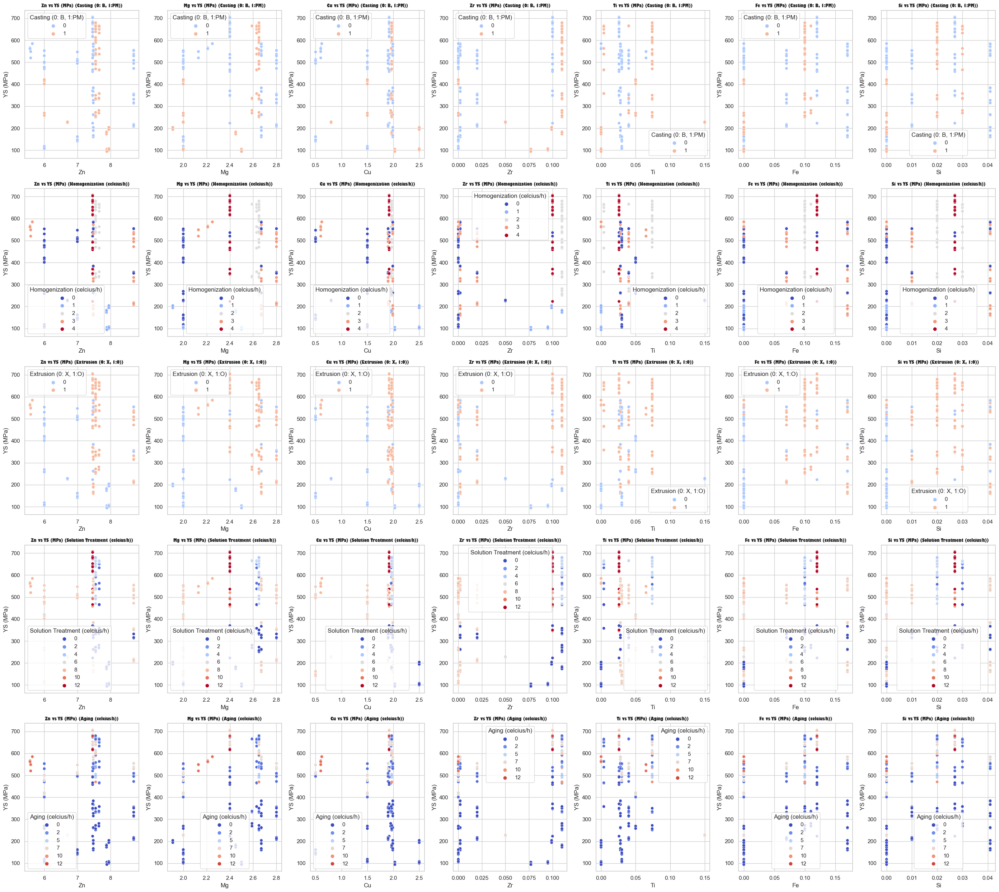

In [5]:
#higly resolved 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# Ensure you use a font that supports the degree Celsius symbol, e.g., 'Arial' or 'Noto Sans'
prop = fm.FontProperties(fname=fm.findSystemFonts(fontpaths=None, fontext='ttf')[0])  # Load a system font

# Alternatively, specify a known path to a font like Arial Unicode MS or Noto Sans
# prop = fm.FontProperties(fname=r"C:\Windows\Fonts\arial.ttf")

# Load the Excel file using the given path
file_path = r"C:\Users\loneo\OneDrive\Documents\mini project\al data.xlsx"
data_cleaned = pd.read_excel(file_path, header=1)

# Rename columns for better readability
data_cleaned.columns = ['Index', 'Zn', 'Mg', 'Cu', 'Zr', 'Ti', 'Fe', 'Si', 'Casting (0: B, 1:PM)', 
                        'Homogenization (celcius/h)', 'Extrusion (0: X, 1:O)', 'Solution Treatment (celcius/h)', 
                        'Aging (celcius/h)', 'YS (MPa)', 'TS (MPa)', 'EL (%)']

# Drop rows with missing or invalid data
data_cleaned.dropna(subset=['Zn', 'Mg', 'Cu', 'Zr', 'Ti', 'Fe', 'Si', 'YS (MPa)', 'TS (MPa)', 'EL (%)'], inplace=True)

# Set up the plotting environment
sns.set(style="whitegrid")
fig, axes = plt.subplots(5, 7, figsize=(28, 25))

# List of elements and their corresponding tensile properties
elements = ['Zn', 'Mg', 'Cu', 'Zr', 'Ti', 'Fe', 'Si']
properties = ['YS (MPa)', 'TS (MPa)', 'EL (%)']

# List of fabrication processes for color encoding
fabrication_processes = ['Casting (0: B, 1:PM)', 'Homogenization (celcius/h)', 'Extrusion (0: X, 1:O)', 
                         'Solution Treatment (celcius/h)', 'Aging (celcius/h)']

# Create scatter plots for each element vs tensile properties, color encoded by different fabrication processes
for i, element in enumerate(elements):
    for j, process in enumerate(fabrication_processes):
        # Scatter plot: YS (MPa) vs Element, colored by the fabrication process
        sns.scatterplot(ax=axes[j, i], x=data_cleaned[element], y=data_cleaned['YS (MPa)'], 
                        hue=data_cleaned[process], palette='coolwarm')
        axes[j, i].set_title(f'{element} vs YS (MPa) ({process})', fontproperties=prop)

# Adjust layout to prevent overlapping
plt.tight_layout()

# Save the figure as a PNG image
plt.savefig(r"C:\Users\loneo\OneDrive\Documents\mini project\fabrication_scatter_plots.png", dpi=300)

# Show the plot
plt.show()


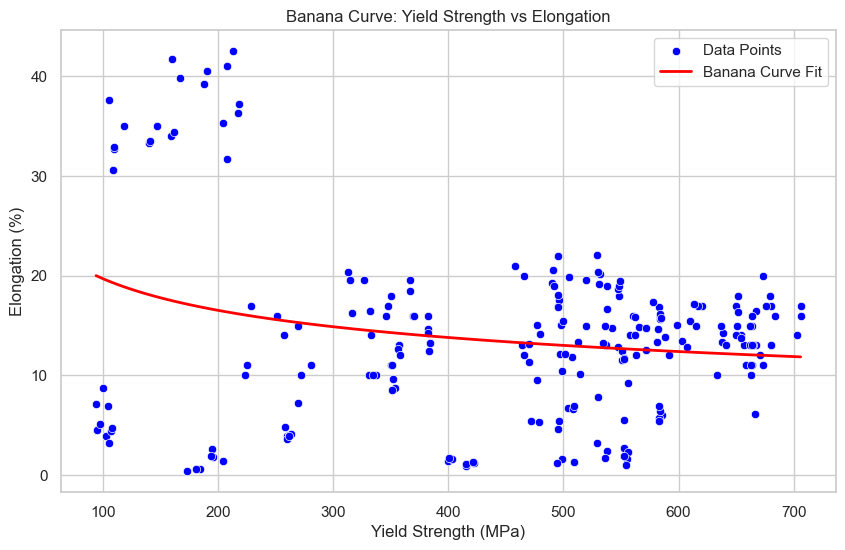

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import curve_fit

# Define a function to fit a curve (banana shape is often polynomial)
def banana_curve(x, a, b, c):
    return a * np.power(x, b) + c

# Extract the relevant data for YS and EL
x_data = data_cleaned['YS (MPa)']
y_data = data_cleaned['EL (%)']

# Fit the banana curve using non-linear least squares
popt, _ = curve_fit(banana_curve, x_data, y_data, p0=[-1, -0.5, 10])

# Generate points for the fitted curve
x_fit = np.linspace(min(x_data), max(x_data), 100)
y_fit = banana_curve(x_fit, *popt)

# Plotting the scatter and the fitted curve
plt.figure(figsize=(10, 6))
sns.scatterplot(x=x_data, y=y_data, label="Data Points", color='blue')
plt.plot(x_fit, y_fit, label="Banana Curve Fit", color='red', linewidth=2)

# Add labels and title
plt.title('Banana Curve: Yield Strength vs Elongation')
plt.xlabel('Yield Strength (MPa)')
plt.ylabel('Elongation (%)')
plt.legend()
plt.grid(True)
# Save the figure as a PNG image
plt.savefig(r"C:\Users\loneo\OneDrive\Documents\mini project\banana_plot.png", dpi=300)

# Show the plot

plt.show()


In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# Load a font that supports special characters (e.g., °C symbol)
prop = fm.FontProperties(fname=r"C:\Windows\Fonts\arial.ttf")

# Load the Excel file from the specified path
file_path = r"C:\Users\loneo\OneDrive\Documents\mini project\al data.xlsx"
data_cleaned = pd.read_excel(file_path, header=1)

# Rename columns for better readability
data_cleaned.columns = ['Index', 'Zn', 'Mg', 'Cu', 'Zr', 'Ti', 'Fe', 'Si', 'Casting (0: B, 1:PM)', 
                        'Homogenization (celcius/h)', 'Extrusion (0: X, 1:O)', 'Solution Treatment (celcius/h)', 
                        'Aging (celcius/h)', 'YS (MPa)', 'TS (MPa)', 'EL (%)']

# Drop rows with missing or invalid data
data_cleaned.dropna(subset=['Zn', 'Mg', 'Cu', 'Zr', 'Ti', 'Fe', 'Si', 'YS (MPa)', 'TS (MPa)', 'EL (%)'], inplace=True)

# Set up a large plot with high DPI for a highly resolved image
sns.set(style="whitegrid")
fig, axes = plt.subplots(5, 7, figsize=(40, 35), dpi=600)  # Large image size and high DPI for better resolution

# List of elements and their corresponding tensile properties
elements = ['Zn', 'Mg', 'Cu', 'Zr', 'Ti', 'Fe', 'Si']
properties = ['YS (MPa)', 'TS (MPa)', 'EL (%)']

# List of fabrication processes for color encoding
fabrication_processes = ['Casting (0: B, 1:PM)', 'Homogenization (celcius/h)', 'Extrusion (0: X, 1:O)', 
                         'Solution Treatment (celcius/h)', 'Aging (celcius/h)']

# Create scatter plots for each element vs tensile properties, color encoded by different fabrication processes
for i, element in enumerate(elements):
    for j, process in enumerate(fabrication_processes):
        sns.scatterplot(ax=axes[j, i], x=data_cleaned[element], y=data_cleaned['YS (MPa)'], 
                        hue=data_cleaned[process], palette='coolwarm', legend=False)
        axes[j, i].set_title(f'{element} vs YS (MPa)\n({process})', fontproperties=prop)

# Adjust layout to prevent overlapping of plots and titles
plt.tight_layout(pad=4.0)

# Save the figure as a high-resolution PNG image with large dimensions
plt.savefig(r"C:\Users\loneo\OneDrive\Documents\mini project\fabrication_scatter_plots_large.png", dpi=600)

# Show the plot
plt.show()


In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# Load a font that supports special characters (e.g., °C symbol)
prop = fm.FontProperties(fname=r"C:\Windows\Fonts\arial.ttf")

# Load the Excel file from the specified path
file_path = r"C:\Users\loneo\OneDrive\Documents\mini project\al data.xlsx"
data_cleaned = pd.read_excel(file_path, header=1)

# Rename columns for better readability
data_cleaned.columns = ['Index', 'Zn', 'Mg', 'Cu', 'Zr', 'Ti', 'Fe', 'Si', 'Casting (0: B, 1:PM)', 
                        'Homogenization (celcius/h)', 'Extrusion (0: X, 1:O)', 'Solution Treatment (celcius/h)', 
                        'Aging (celcius/h)', 'YS (MPa)', 'TS (MPa)', 'EL (%)']

# Drop rows with missing or invalid data
data_cleaned.dropna(subset=['Zn', 'Mg', 'Cu', 'Zr', 'Ti', 'Fe', 'Si', 'YS (MPa)', 'TS (MPa)', 'EL (%)'], inplace=True)

# Set up a normal-sized plot with high DPI for a highly resolved image
sns.set(style="whitegrid")
fig, axes = plt.subplots(5, 7, figsize=(20, 15), dpi=600)  # Normal size (20x15 inches), high DPI (600) for good resolution

# List of elements and their corresponding tensile properties
elements = ['Zn', 'Mg', 'Cu', 'Zr', 'Ti', 'Fe', 'Si']
properties = ['YS (MPa)', 'TS (MPa)', 'EL (%)']

# List of fabrication processes for color encoding
fabrication_processes = ['Casting (0: B, 1:PM)', 'Homogenization (celcius/h)', 'Extrusion (0: X, 1:O)', 
                         'Solution Treatment (celcius/h)', 'Aging (celcius/h)']

# Create scatter plots for each element vs tensile properties, color encoded by different fabrication processes
for i, element in enumerate(elements):
    for j, process in enumerate(fabrication_processes):
        sns.scatterplot(ax=axes[j, i], x=data_cleaned[element], y=data_cleaned['YS (MPa)'], 
                        hue=data_cleaned[process], palette='coolwarm', legend=False)
        axes[j, i].set_title(f'{element} vs YS (MPa)\n({process})', fontproperties=prop)

# Adjust layout to prevent overlapping of plots and titles
plt.tight_layout(pad=4.0)

# Save the figure as a high-resolution PNG image
plt.savefig(r"C:\Users\loneo\OneDrive\Documents\mini project\fabrication_scatter_plots_normal_size.png", dpi=600)

# Show the plot
plt.show()
